Presentation on 

Monte Carlo methods

(Probabilistic Programming techniques for Deep Learning) 

Srikar Reddy Gopaladinne 

Nov 11, 2022, Davis 101 

CSE 676 - Deep Learning by Dr. Wen Dong

In [ ]:
import sys
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras import Sequential
import tensorflow_datasets as tfds

import tensorflow_probability as tfp
tfd = tfp.distributions
tfpl = tfp.layers

import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline

tf.random.set_seed(42)
np.random.seed(42)

import math
import os

import torch
import torch.utils.data
from torch import nn
from torch.nn import functional as F
from torch.nn.parameter import Parameter


# from visualization import plot_predictive
import seaborn as sns

# import subspace_inference.utils as utils
# from subspace_inference.posteriors import SWAG
# from subspace_inference import models, losses, utils
# from subspace_inference.models import MLP
# from swag import data, models, utils, losses
# from swag.posteriors import SWAG


from tqdm import tqdm

import os

torch.backends.cudnn.benchmark = True
torch.manual_seed(1)
torch.cuda.manual_seed(1)
np.random.seed(1)



%load_ext autoreload
%autoreload 2

print(' TF Version:', tf.__version__, '\n', # 2.7.0
      'TFP Version:', tfp.__version__) # 0.15.0

 TF Version: 2.9.2 
 TFP Version: 0.17.0


##Monte Carlo methods


*   Objective of this session is to get an intuition behind these algorithms
*   See some examples using these methods from Tensor Flow Probability library
*   Diagnosing results from these algorithms (most important take away)


##Intuitive Cheat Sheat of Bayesian Deep Learning

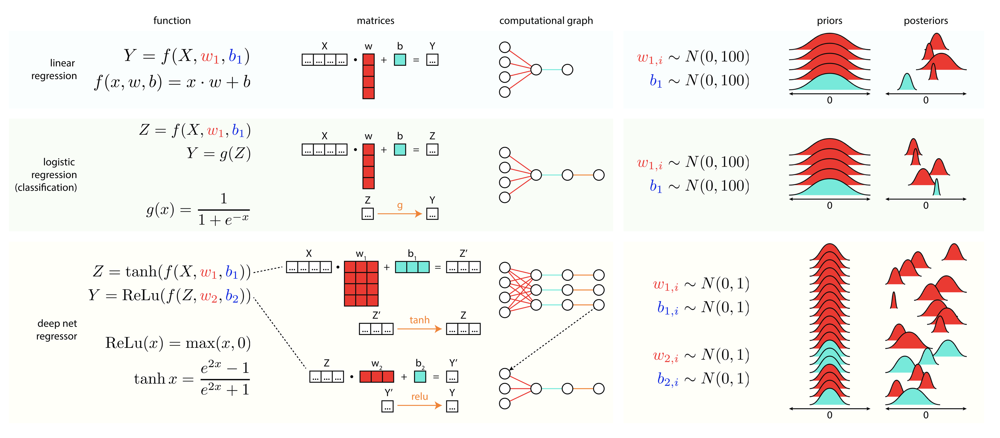

##Why Probabilistic Thinking in Deep Learning 


*   Probability is all about quantifying uncertainty.

*   Neural Networks are filled with uncertainties. 

*   Different weight selections can be obtained for the same training routine.

*   Uncertainty in weights is due to random nature of initialization and, selection of training and validation data.

*   deep learning models are prone to overfitting, which adversely affect their generalization capabilities. 
*   The Deep Learning models can seem over-confident in their predictions. This lack of knowledge how uncertain one's confidence interval can be detrimental in the applications such as Physics, Diagnosis, Finance, etc.

*   Cannot avoid uncertainty by using tricks such as early stopping.
*   Therefore, we need Probability theory to make sense of uncertainties involved.



##What is Probability ? 
easy question, many answers..

#Frequentist Interpretation

*   Probability is the long-run frequency of events. 
*   Makes sense generally but, doesn’t make sense for infrequent events.

#Bayesian Interpretation


*   Probability is the measure of belief, or confidence, of an event occurring Based on individual’s beliefs and information, one quantifies the Probability



"When the facts change, I change my mind. What do you do, sir?" 

~ John Maynard Keynes

Prior beliefs influence posterior beliefs. Bayesian inference is simply updating your prior beliefs(Hypothesis) in a precise manner after considering new evidence(Data). 

Bayes'theorem states that: 
 
 $$P(H \mid D)=\frac{P(D \mid H) P(H)}{P(D)}=\frac{P(D, H)}{\int_H P\left(D, H^{\prime}\right) d H^{\prime}}$$



 $$P(H \mid D)=\frac{P(D \mid H) P(H)}{P(D)}=\frac{P(D, H)}{\int_H P\left(D, H^{\prime}\right) d H^{\prime}}$$


- In the Bayes' Theorem:
  - $H$: hypothesis about which one holds some prior belief
  - $D$: Some data that will update one's belief about $H$
  - $P(D \mid H)$: likelihood that Data appeared provided the Hypothesis
  - $P(H)$ is the prior
  - $P(D)=\int_H P\left(D, H^{\prime}\right) d H^{\prime}$ is the evidence. 
  - $P(H \mid D)$ is called posterior.  

  - $P(D \mid H) P(H)=P(D, H)$ is the joint probability of $D$ and $H$. 



To get an intution behind Bayesian way, lets do an experiment.

##Mandatory Coin Flip Experiment

*   We want to find the probability of Heads in a coin flip experiment
*   Let p be the probability of finding the heads.
*   We begin to flip a coin, and record the observations: either H or T
*   We are interested in finding out how our probability changes as we see more and more number of flips


In [ ]:
# Build Graph
rv_coin_flip_prior = tfp.distributions.Bernoulli(probs=0.5, dtype=tf.int32)

num_trials = tf.constant([0,1, 2, 3, 4, 5, 8, 15, 50, 500, 1000, 2000])

coin_flip_data = rv_coin_flip_prior.sample(num_trials[-1])

# prepend a 0 onto tally of heads and tails, for zeroth flip
coin_flip_data = tf.pad(coin_flip_data,tf.constant([[1, 0,]]),"CONSTANT")

# compute cumulative headcounts from 0 to 2000 flips, and then grab them at each of num_trials intervals
cumulative_headcounts = tf.gather(tf.cumsum(coin_flip_data), num_trials)

rv_observed_heads = tfp.distributions.Beta(
    concentration1=tf.cast(1 + cumulative_headcounts, tf.float32),
    concentration0=tf.cast(1 + num_trials - cumulative_headcounts, tf.float32))

probs_of_heads = tf.linspace(start=0., stop=1., num=100, name="linspace")
observed_probs_heads = tf.transpose(rv_observed_heads.prob(probs_of_heads[:, tf.newaxis]))

In [ ]:
import matplotlib.pyplot as plt


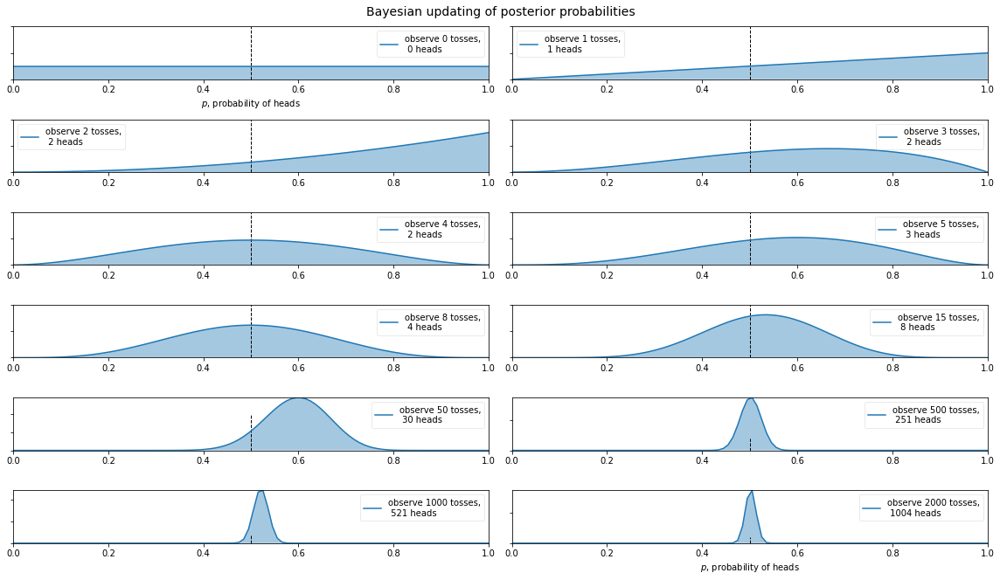

In [ ]:
# For the already prepared, I'm using Binomial's conj. prior.
plt.figure(figsize = (16, 9))
for i in range(len(num_trials)):
    sx = plt.subplot(len(num_trials)/2, 2, i+1)
    plt.xlabel("$p$, probability of heads") \
    if i in [0, len(num_trials)-1] else None
    plt.setp(sx.get_yticklabels(), visible=False)
    plt.plot(probs_of_heads, observed_probs_heads[i], 
             label="observe %d tosses,\n %d heads" % (num_trials[i], cumulative_headcounts[i]))
    plt.fill_between(probs_of_heads, 0, observed_probs_heads[i] 
                    , alpha=0.4)
    plt.vlines(0.5, 0, 4, color="k", linestyles="--", lw=1)
    leg = plt.legend()
    leg.get_frame().set_alpha(0.4)
    plt.autoscale(tight=True)


plt.suptitle("Bayesian updating of posterior probabilities", y=1.02,
             fontsize=14)
plt.tight_layout()

The prior probability that our coin toss would result in heads is uniformly distributed. As we don't know anything about the coin, we believe that p could be any value between 0 to 1.

But, as we get more and more data by performing experiments, our beliefs change and we update our posterior probability. 

As more data accumulates, we would see more and more probability being assigned at p = 0.5 , though never all of it.

This is how a Bayesian would update his probabilites based on data and estimate the probability unlike a frequentist who would imagine doing infinite experiments and take the limit value of those experiments as the probability. The above plot is a visual demonstration of Bayesian way of updating posterior probability distribution.  

Another experiment to gain deeper insight into Bayesian way

## Inverse Turing Test

We will try to figure out if you are a human or a bot. To figure this out, we will ask you to give us a sequence of random numbers. 

https://calmcode.io/blog/inverse-turing-test.html

The above link directs you to mimic a coin toss experiment as if you are a random number generating machine. Then based on your coin flips, the bayesian analysis is done. 

A very interesting test to gain intuition behind Bayesian Analysis and Random Number generation.


##How to think like a Bayesian (probabilistic programming) 

 Then figure out which Distributions of your parameters would have created your observed data. (Or change your initial beliefs about parameters’ range and pass down your uncertainty systematically)

1.    Define your model’s priors based on your beliefs - how does parameters which make up your model vary. (Define probability distributions)
2.   Feed Observations to the model
3.   Then figure out which Distributions of your parameters would have created your observed data. (Or change your initial beliefs about parameters’ range and pass down your uncertainty systematically)





##Monte Carlo 

Estimation of posterior probability distributions using a stochastic process

##Markov Chain Monte Carlo Algorithms
###Intensive computing algorithms for Posterior Distribution

*   The inner engines of Bayesian Inference.
*   One just need to sample the posterior and do model averaging.
*   But, it is very hard to sample the posterior in high dimensions.
*   Let’s look at visuals of areas formed by probability distributions to understand the problem with sampling in higher dimensions better.



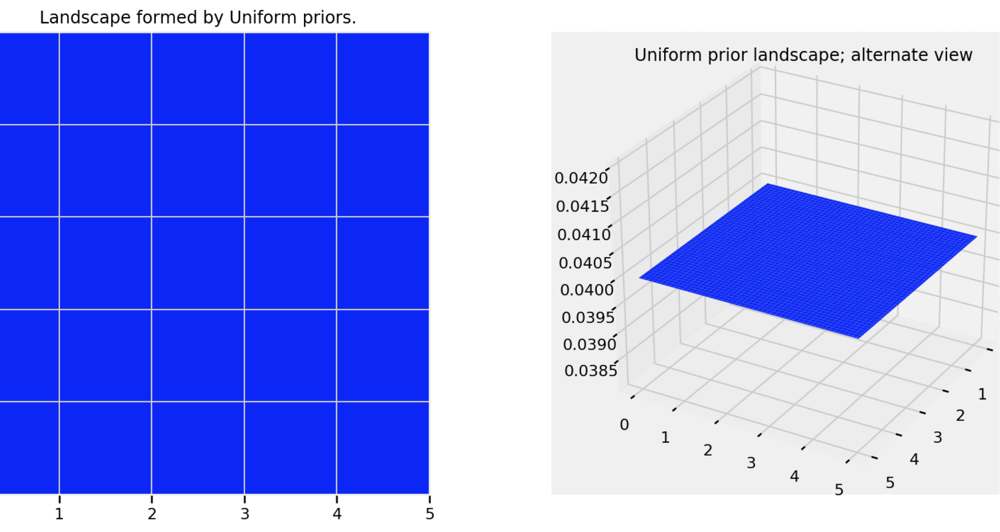

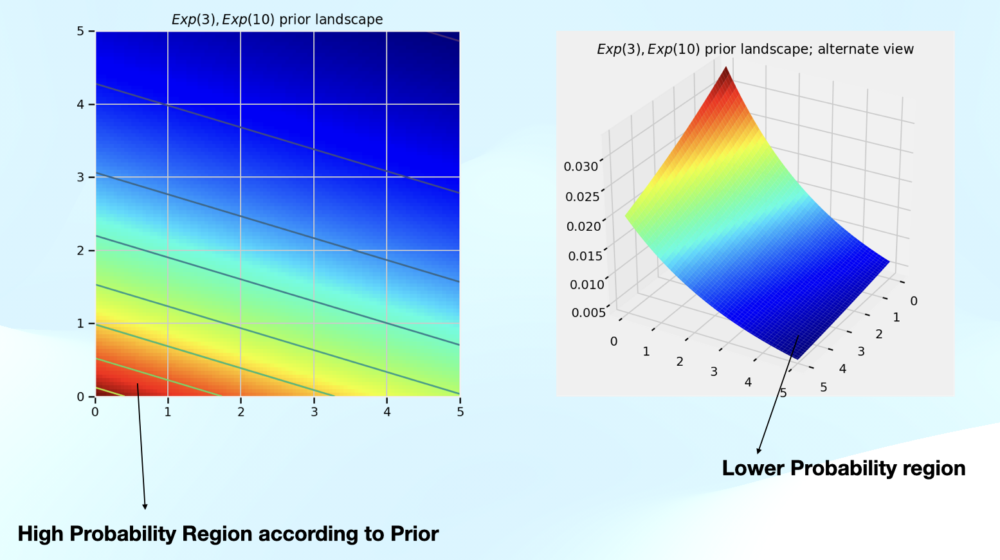

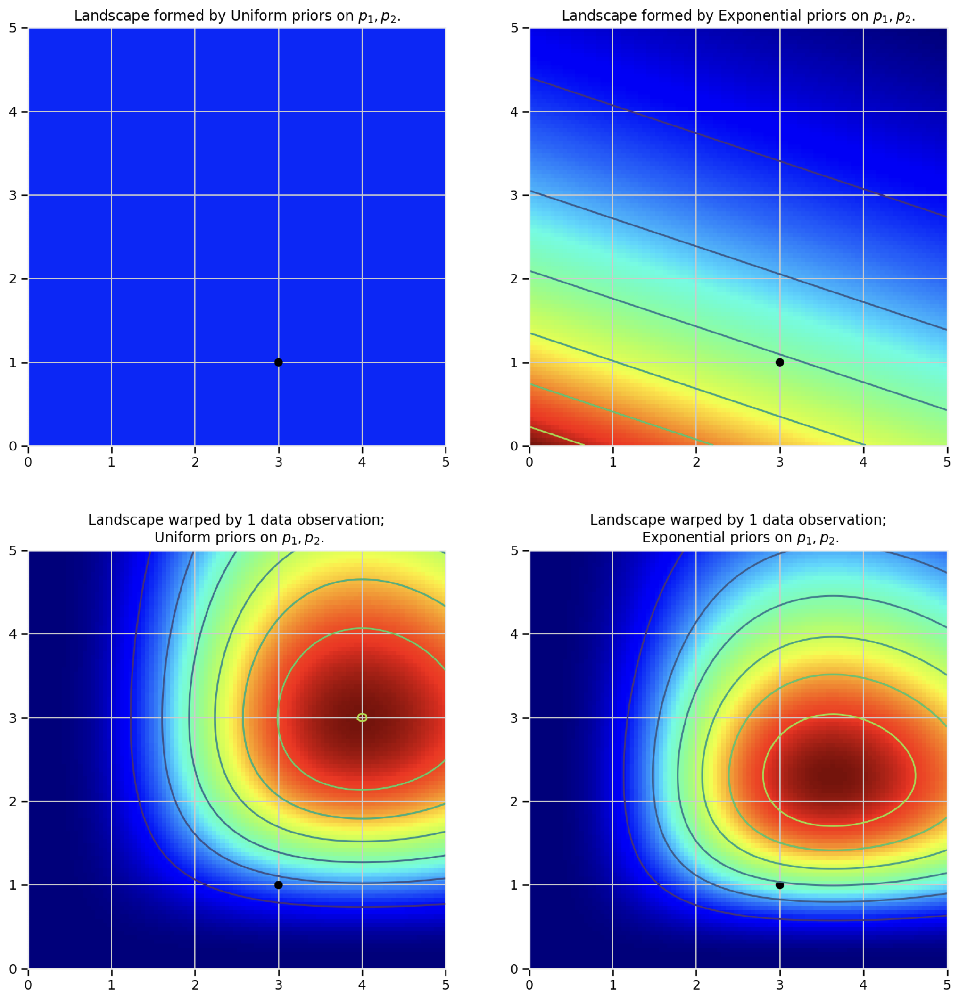

As the data comes,
Posterior surface gets wrapped around high probability regions (imagine raising volcanoes); 

Observe the difference in Posterior distributions when different Priors are used;

Prior distribution affects your Posterior; Prior was your model of uncertainty which you are changing into Posterior in accordance with data; 

More resistance to points for which Prior Probability is lower;

##Summarizing the Problem 

*   Explore the deformed posterior space generated by our prior surface and observed data to find the posterior distribution.
*   But, Curse of Dimensionality exponentially kicks in when N goes up.
*   MCMC returns samples from the posterior distribution, not the distribution itself.
*   Monte Carlo is all about approximating Probability distribution based on these samples. 
*   MCMC will hopefully converge towards the areas of high posterior probability.
*   Convergence in MCMC context is to find the broad space over which posterior probability distribution lies. 







##Every MCMC algorithm ever :

1.   Start at current position.
2.   Propose moving to a new position (investigate a pebble near you).
3.   Accept/Reject the new position based on the position's adherence to the data and prior distributions (ask if the pebble likely came from the mountain).
*   If you accept: Move to the new position. Return to Step 1.
*   Else: Do not move to new position. Return to Step 1.
4.  After a large number of iterations, return all accepted positions.

For the moment, forget about posterior densities and MCMC. 

Consider instead the tale of Good King Markov 
Ruling a 10 island nation called Metropolis.


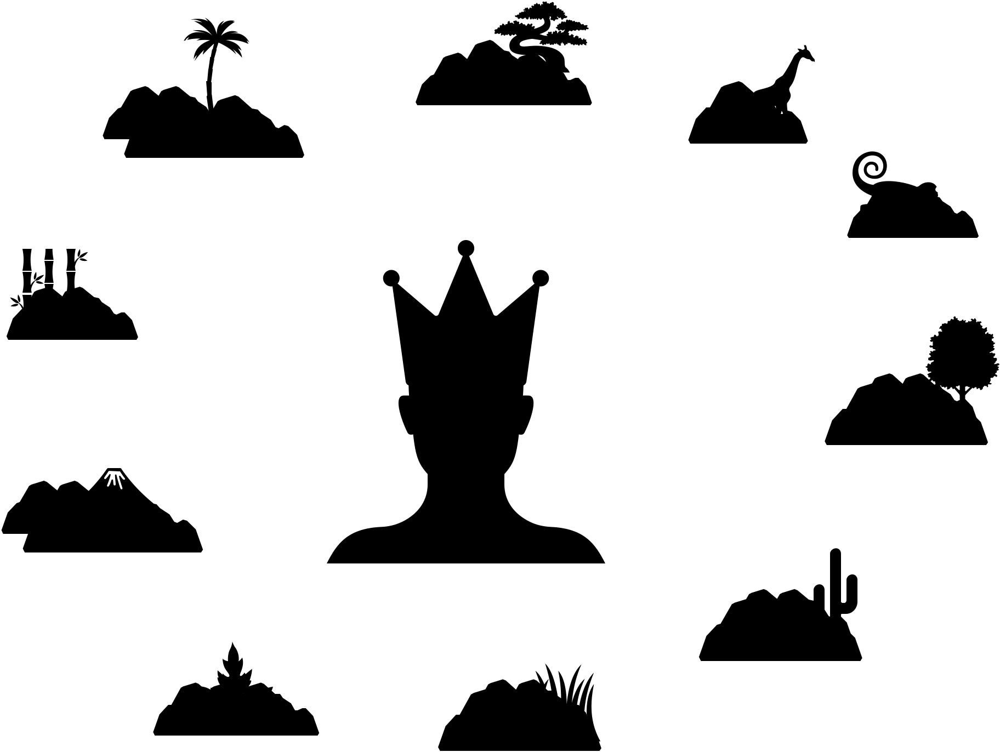

Markov loves to visit each of his ten islands and spend his time there based on the island’s population size.

But, he only visits the islands which are adjacent to the one he is currently in.



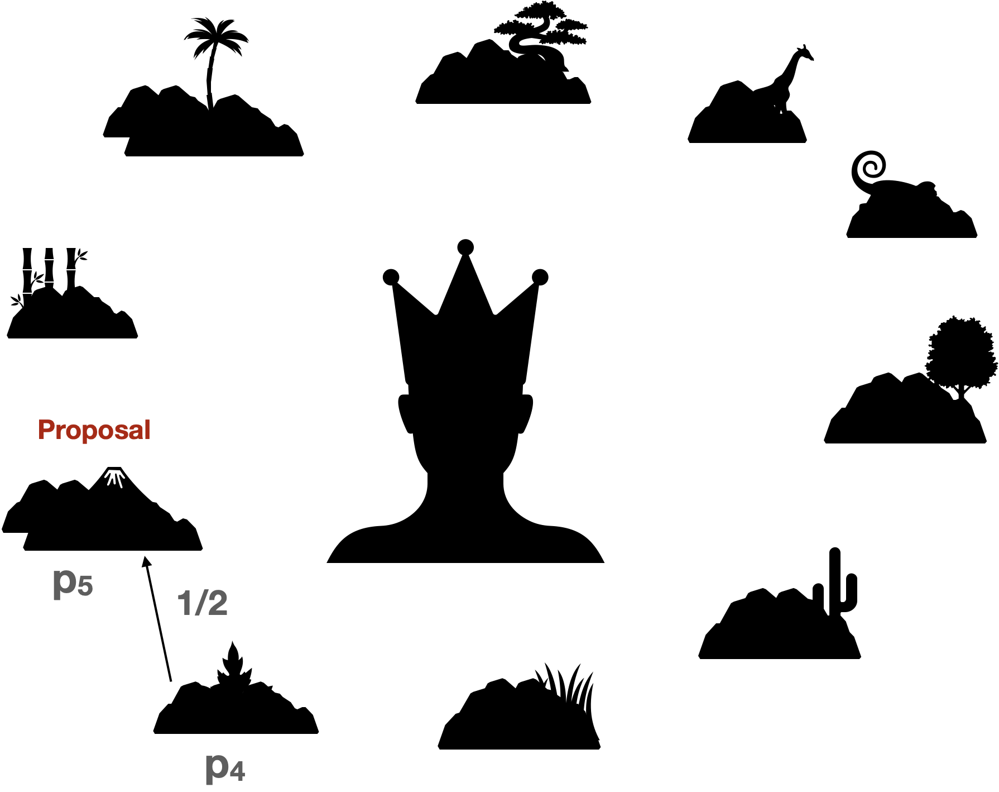

King Markov's Algorithm

1.   Flip a coin to choose between left or right island; call the chosen island the “Proposal” island
2.   Find the population of the proposal
     and current island 
3.   Move to the “Proposal island” 
     with Probability = p5 / p4
4.   Repeat from 1

This technique magically ensures that King visits and 
stays in each island proportional to its population,
But, only in the long run.


In [ ]:
# Install packages that are not installed in colab
try:
  import google.colab
  %pip install -q watermark
  %pip install git+https://github.com/ksachdeva/rethinking-tensorflow-probability.git
except:
  pass

     |████████████████████████████████| 1.6 MB 33.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/ksachdeva/rethinking-tensorflow-probability.git to /tmp/pip-req-build-5knh3usi
  Running command git clone -q https://github.com/ksachdeva/rethinking-tensorflow-probability.git /tmp/pip-req-build-5knh3usi
  Created wheel for rethinking: filename=rethinking-0.1.0-py3-none-any.whl size=8397 sha256=e38b9f07ccac8ebde8f9f27cfb78bcb3fbe44b1f8ee01954e27ad8a9c1b2ae05
  Stored in directory: /tmp/pip-ephem-wheel-cache-1cm9t76b/wheels/04/4c/71/5c37bbbd5c6b8ebc6a2321d702f0624acca75badffdfbed543
Successfully built rethinking


In [ ]:
%load_ext watermark

In [ ]:
from functools import partial

#from jax import ops
#import jax.numpy as jnp

# Core
import numpy as np
import arviz as az
import pandas as pd
import tensorflow as tf
import tensorflow_probability as tfp

# visualization
import matplotlib.pyplot as plt

from rethinking.data import RethinkingDataset
from rethinking.data import dataframe_to_tensors
from rethinking.mcmc import sample_posterior


# aliases
tfd = tfp.distributions
Root = tfd.JointDistributionCoroutine.Root


In [ ]:
%watermark -p numpy,tensorflow,tensorflow_probability,arviz,scipy,pandas,rethinking

numpy                 : 1.21.6
tensorflow            : 2.9.2
tensorflow_probability: 0.17.0
arviz                 : 0.12.1
scipy                 : 1.7.3
pandas                : 1.3.5
rethinking            : 0.1.0



In [ ]:
# config of various plotting libraries
%config InlineBackend.figure_format = 'retina'

In [ ]:
# Takes few minutes to run

num_weeks = int(1e5)
positions = np.repeat(0, num_weeks)
current = 10

coin_dist = tfd.Bernoulli(probs=0.5)
proposal_dist = tfd.Uniform(low=0.0, high=1.0)

for i in range(num_weeks):
    # record current position
    positions[i] = current

    # flip coin to generate proposal
    bern = coin_dist.sample().numpy()

    proposal = current + (bern * 2 - 1)

    # now make sure he loops around the archipelago
    proposal = np.where(proposal < 1, 10, proposal)
    proposal = np.where(proposal > 10, 1, proposal)

    # move?
    prob_move = proposal / current
    unif = proposal_dist.sample().numpy()
    current = np.where(unif < prob_move, proposal, current)


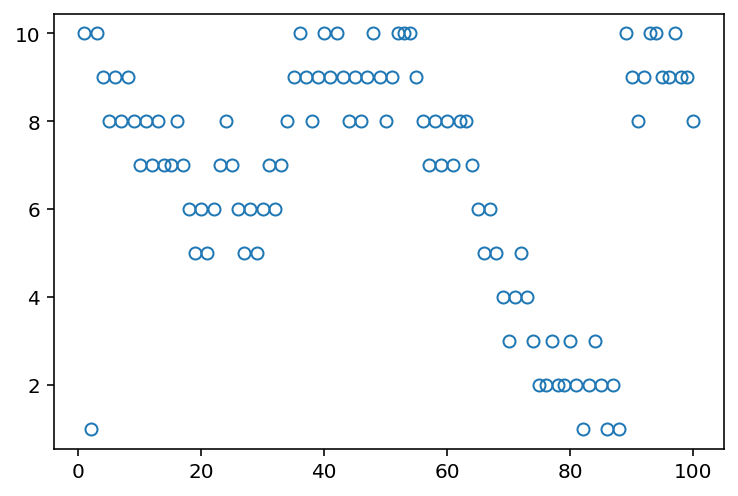

In [ ]:
plt.plot(range(1, 101), positions[:100], "o", mfc="none");

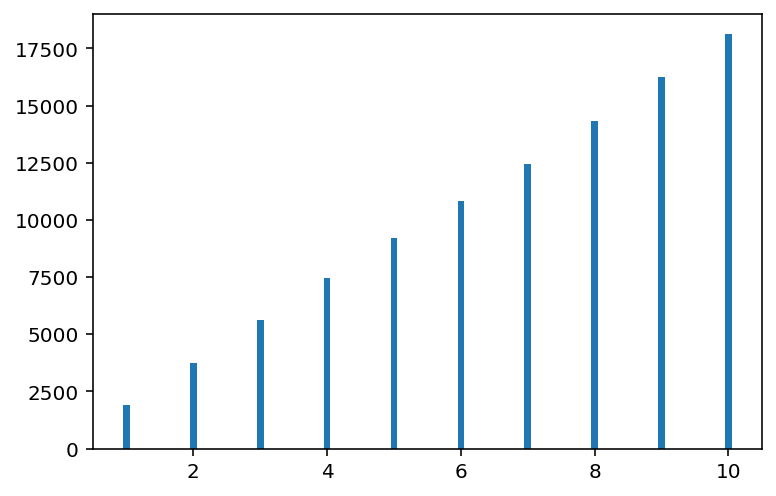

In [ ]:
plt.hist(positions, bins=range(1, 12), rwidth=0.1, align="left");

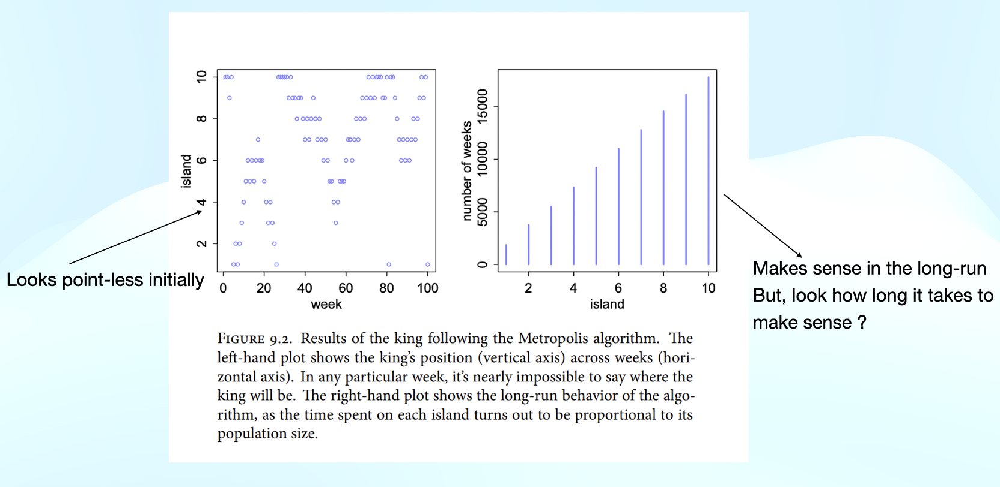

Analogy between Markov King & MCMC

*   Islands: Parameter Values
*   Population Size : posterior probabilities
*   Visit each parameter value in proportion to its posterior probability. 
*   Any number of dimensions (parameters).
*   History doesn’t matter; only thing matters is where you are currently
*   Need not visit only his neighbors.
*   Works even if he doesn’t know how many islands are there.
*   Only thing matters is that his transitions should reflect the posterior probabilities.
*   Law of Large Numbers and Ergodicity in action.











##Metropolis vs Metropolis Hasting

Symmetric vs Asymmetric 

*   The way we choose our proposed parameter values at each step is symmetric—so that there is an equal chance of proposing from A to B and from B to A—then the Metropolis algorithm will eventually give us a collection of samples from the joint posterior.
*   Metropolis Hastings allows asymmetric proposals. This would mean, in the context of King Markov’s fable, that the King’s coin were biased to lead him clockwise/anti-clockwise on average.






##Gibbs Sampling

*   Generates savvy proposals
*   We get a good estimate of the posterior from Gibbs sampling with many fewer samples than a comparable Metropolis approach.
*   The improvement arises from adaptive proposals in which the distribution of proposed parameter values adjusts itself intelligently, depending upon the parameter values at the moment.
*   Uses particular combinations of prior distributions and likelihoods known as Conjugate pairs. 
*   Conjugate pairs have analytical solutions for the posterior distribution of an individual parameter. 
*   And these solutions are what allow Gibbs sampling to make smart jumps around the joint posterior distribution of all parameters.


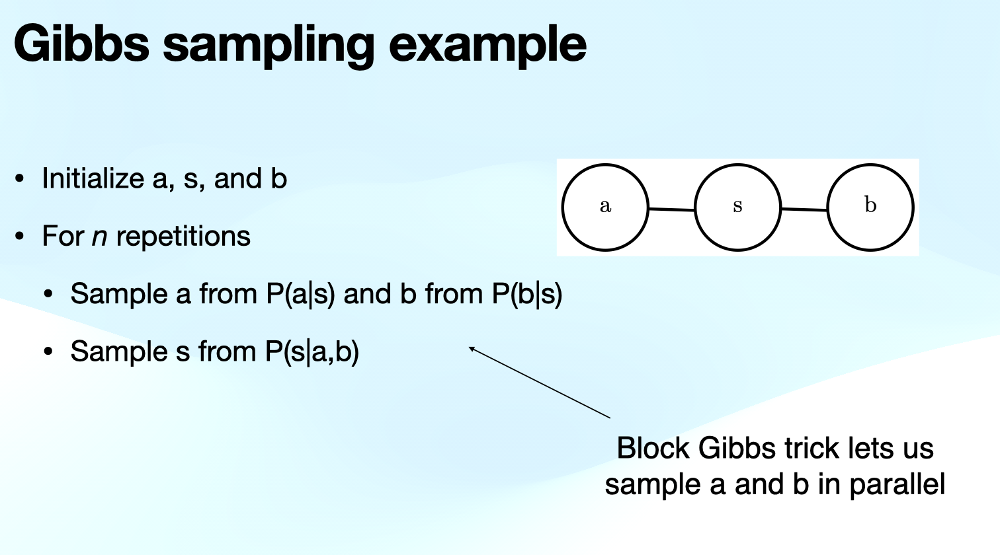

##Cool Simulations of various MCMC methods

http://chi-feng.github.io/mcmc-demo/app.html?algorithm=RandomWalkMH&target=banana


##Problems with Metropolis & Gibbs

*   Difficulty arises when High Correlation parameters are there

*   High correlation means a narrow ridge of high probability combinations, and both Metropolis and Gibbs make too many dumb proposals of where to go next. So they get stuck.

*   Their proposals don’t know enough about the global shape of the posterior. They don’t know where they are going. Needs step size tuning..





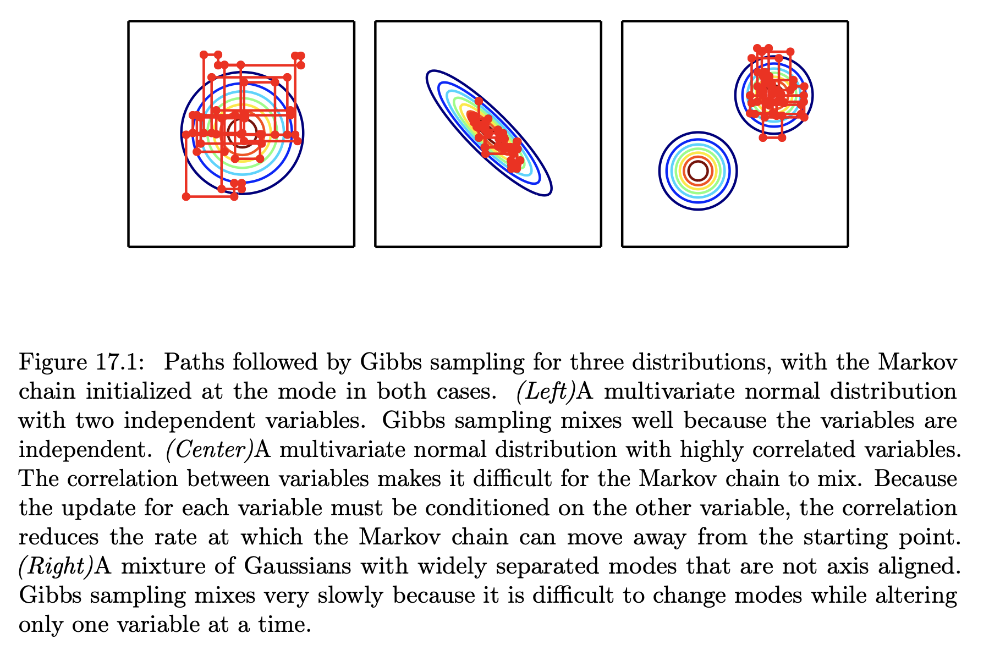

##High Dimensional Sadness
Boringly called as Concentration of Measure

*   Most of the probability mass of a high-dimension distribution is always very far from the mode of the distribution
*   At some radial distance from the peak, mineral (probability mass) is maximized. Remember, Bayesians are not mountaineers looking for peaks, they are miners looking for mass. 





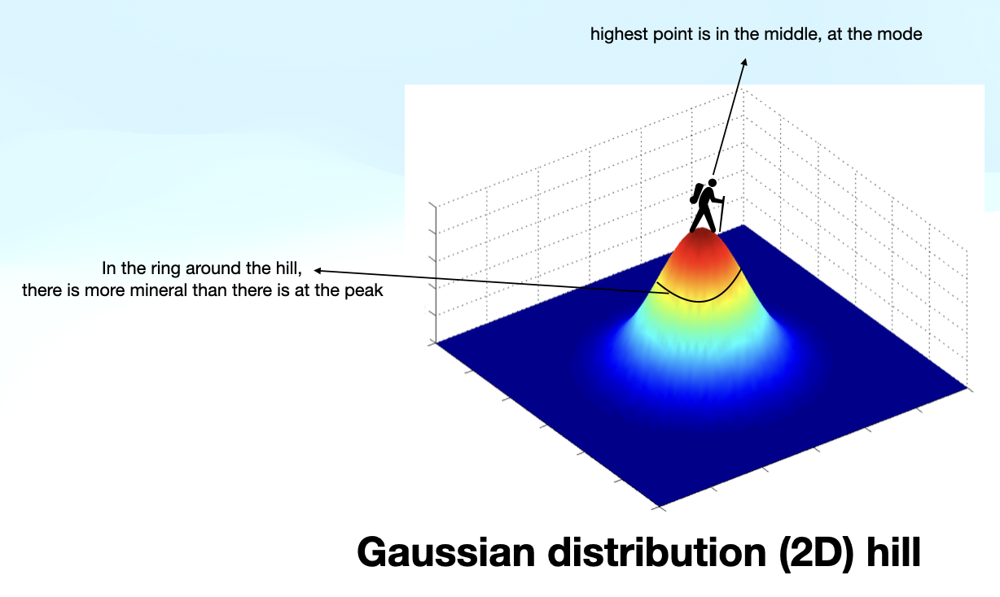

##If High Dimensional Sadness has a face

sample randomly from a high-dimension distribution, and plot the radial distances of the points

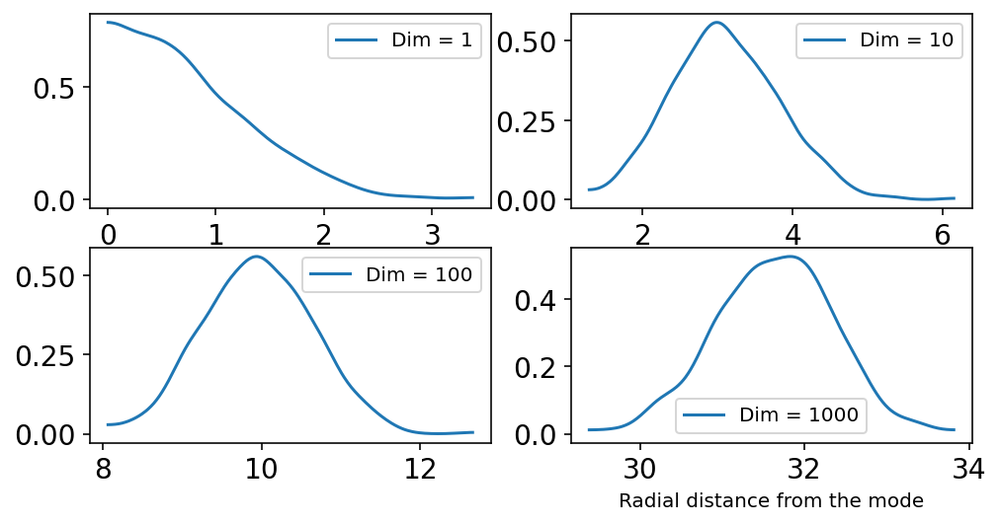

In [ ]:
T = int(1e3)

_, ax = plt.subplots(2, 2, figsize=(8, 4))
plt.xlabel("Radial distance from the mode")


def build_and_plot(d, ax_p):
    loc = tf.cast(np.repeat(0, d), dtype=tf.float32)
    scale_diag = np.identity(d, dtype=np.float32)
    Y = tfd.MultivariateNormalDiag(loc=loc, scale_diag=scale_diag).sample((T,)).numpy()
    rad_dist = lambda Y: np.sqrt(np.sum(Y ** 2))
    Rd = list(map(lambda i: rad_dist(Y[i]), np.arange(T)))
    az.plot_kde(np.array(Rd), bw=0.18, label=f"Dim = {d}", ax=ax_p)


build_and_plot(1, ax[0][0])
build_and_plot(10, ax[0][1])
build_and_plot(100, ax[1][0])
build_and_plot(1000, ax[1][1])


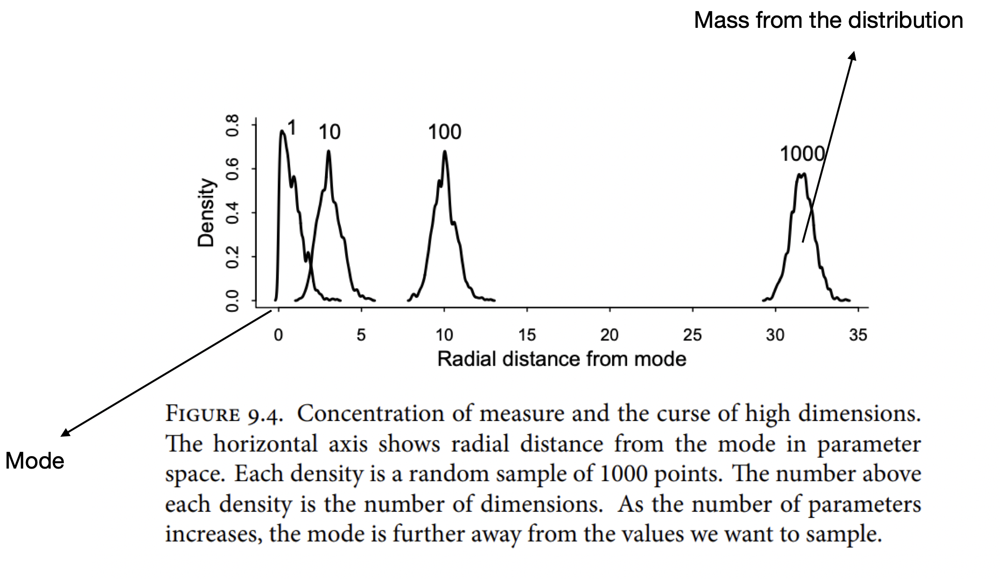

##Summary of Problems with MCMC till now

*   They get stuck in a narrow, highly curving region of parameter space.
*   Mode is an irrelevant part of the parameter space. In even a dozen dimensions, there just isn’t much probability mass near the mode. So, optimization techniques won’t work.
*   Non-Bayesian methods of fitting such models play dangerous games by summarizing some of those parameters with the mode, even though the posterior mean can be very far away.





“It appears to be a quite general principle that, whenever there is a randomized way of doing something, then there is a nonrandomized way that delivers better performance but requires more thought.”

—E. T. Jaynes

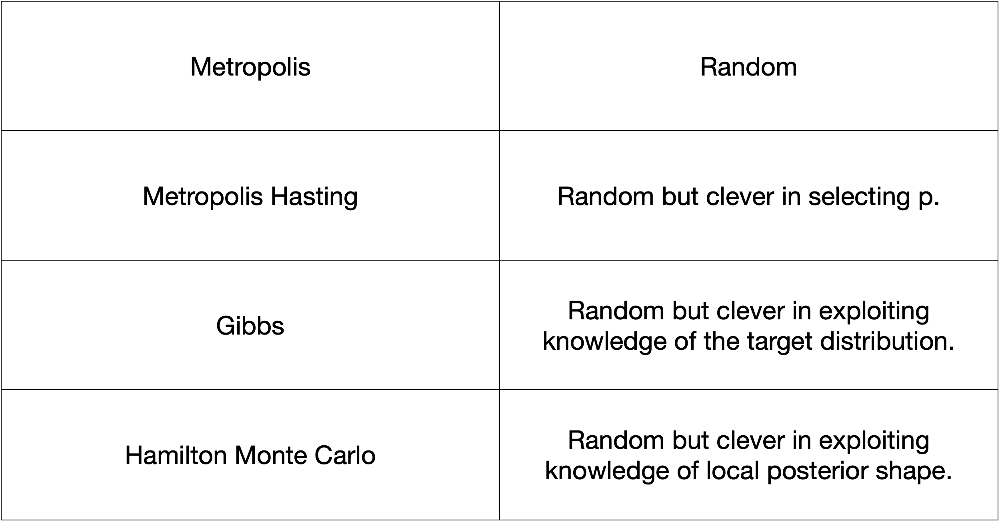

##Less Random needs more thought.
##But, More thought increases Compute.
##But, on long run, overall efficiency increases.

##King Monty’s Royal Drive

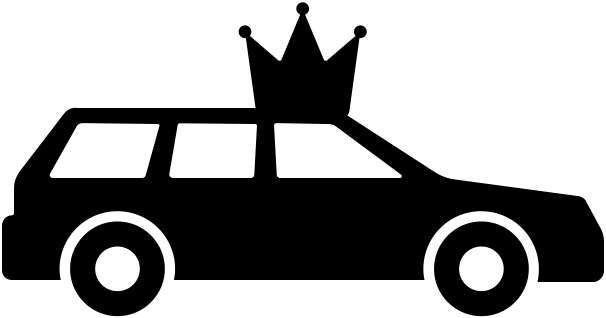

Monty’s kingdom is not a discrete set of islands. Instead, it is a continuous territory stretched out along a narrow valley, running north-south. 

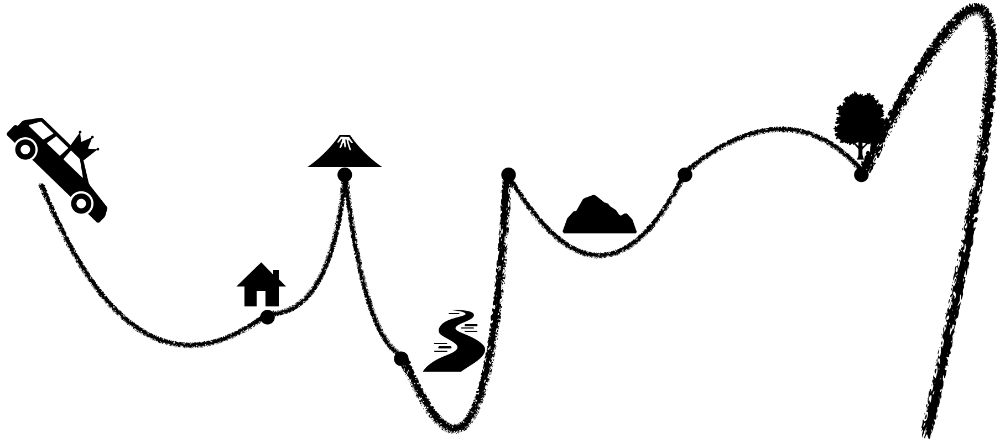

Monty should visit his citizens in proportion to their local population density. Valleys have more people than mountains

##Hamilton is the Driver 
How does he fulfill the king’s desire..

1. The king’s vehicle picks random direction, either north or south, and drives off at a random momentum.
2. As the vehicle goes uphill, it slows down and turns around when its declining momentum forces it to.
3. Then it picks up speed again on the way down.
4. After a fixed period of time, they stop the vehicle, get out, and start shaking hands and kissing babies.
5. Get back in the vehicle. Repeat. 

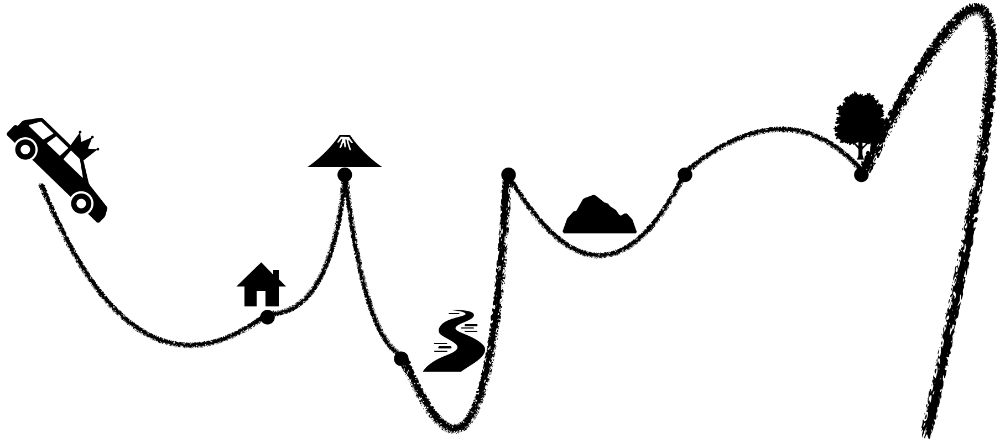

When the initial momentum is small, the vehicle starts to turn around earlier. But when the initial momentum is large, like in the big swing, the king can traverse the entire valley before stopping.

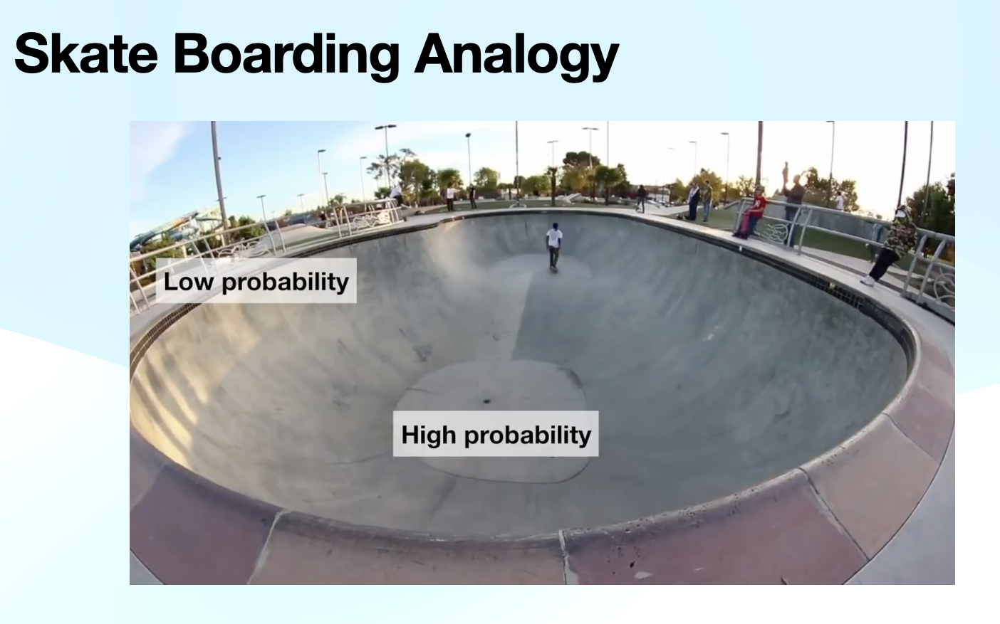

##Analogy vs Reality
Not much difference

In statistical applications, the royal vehicle is the current vector of parameter values.


Basically, a physics simulation of a friction-less particle rolling around a posterior distribution obeying law of conservation of energy. 

Samples comes from its position in fixed points in time.

In this case, the log-posterior is like a bowl, with the point of highest posterior probability at its nadir.

##Advantages of HMC

The autocorrelation between locations visited is very low under this strategy. This means that adjacent locations have a very low, almost zero correlation. The king can move from one end of the valley to another.

In cases where ordinary Metropolis or Gibbs sampling wander slowly through parameter space, Hamiltonian Monte Carlo remains efficient. Because, it exploits the knowledge of local curvature and avoids higher slopes.



##Tuning for HMC

*   The two settings that HMC needs are a choice of number of Leapfrog steps and a choice of Step size for each. 
*   Each path in the simulation is divided up into a number of leapfrog steps. The size of each step is determined by, you guessed it, the step size.
*   If the step size is small, then the particle can turn sharply. If the step size is large, then each leap will be large and could even overshoot the point where the simulation would want to turn around.
*   It is in this way that the path is only an approximation, because it is a series of linear jumps, not an actual smooth curve. This can have important consequences, if the log-posterior bends sharply and the simulation jumps over a bend.






##U-Turn Problem 




*   Because of the combination of leapfrog steps and step size, the paths tend to land close to where they started. Instead of independent samples from the posterior, we get correlated samples, like in a Metropolis chain.

*   This problem is called the U-turn problem—the simulations turn around and return to the same neighborhood.

*   This just shows that the efficiency of HMC comes with the expense of having to tune the leapfrog steps and step size in each application.

*   In the Warm-up phase in the simulation tries to figure out which step size explores the posterior efficiently

*  A No-U-turn sampler guess from the shape of the posterior when the path is turning around. Then it stops the simulation.








Summary of HMC Algorithm

The HMC algorithm needs five things to go:

1. A function that returns the negative log-probability of the data at the current position (parameter values).

2. A function that returns the gradient of the negative log-probability at the current position, 

3. A step size epsilon, 

4. A count of leapfrog steps L, 

5. A starting position

Below is the code to implement these functions for the HMC algorithm:


In [ ]:
def generate_test_data():
    # test data
    _SEED = 7

    seed = tfp.util.SeedStream(seed=_SEED, salt="Testdata")
    y = tfd.Normal(loc=0.0, scale=1.0).sample(50, seed=seed()).numpy()
    x = tfd.Normal(loc=0.0, scale=1.0).sample(50, seed=seed()).numpy()

    # standardize the data
    y = (y - np.mean(y)) / np.std(y)
    x = (x - np.mean(x)) / np.std(x)

    return x, y


x, y = generate_test_data()

y


array([ 0.12833239, -0.22964787, -0.40774608, -0.30924067, -0.75710726,
       -1.12151   ,  0.54429084,  0.20373885,  0.5373924 ,  2.2354805 ,
       -0.55821157,  0.8479281 , -0.01069919, -2.2879438 ,  2.1183472 ,
        0.5721366 ,  1.5381907 , -2.4450817 , -0.15067661,  0.0314163 ,
       -0.06329995, -1.5469027 ,  0.6112922 , -0.6234371 ,  0.7724736 ,
        0.31413972,  2.2127857 , -0.30521753, -0.06263847,  0.60814875,
        1.7873812 , -0.23929906, -0.1567227 , -0.09433585, -0.25074163,
        0.3817731 , -1.289493  , -0.03346271, -0.25672948, -0.02745551,
        1.6410016 , -1.2717627 , -0.18327089,  0.6673328 , -0.7348228 ,
       -0.5346852 , -1.177903  , -0.9149043 , -0.3239217 ,  0.6152883 ],
      dtype=float32)

In [ ]:
def U(q, a=0.0, b=1.0, k=0.0, d=1.0):
    muy = q[0]
    mux = q[1]

    logprob_y = tf.reduce_sum(tfd.Normal(loc=muy, scale=1.0).log_prob(y)).numpy()
    logprob_x = tf.reduce_sum(tfd.Normal(loc=mux, scale=1.0).log_prob(x)).numpy()

    logprob_muy = tfd.Normal(loc=a, scale=b).log_prob(muy).numpy()
    logprob_mux = tfd.Normal(loc=k, scale=d).log_prob(mux).numpy()

    return -(logprob_y + logprob_x + logprob_muy + logprob_mux)

In [ ]:
def U_gradient(q, a=0.0, b=1.0, k=0.0, d=1.0):
    muy = q[0]
    mux = q[1]
    G1 = np.sum(y - muy) + (a - muy) / b ** 2  # dU/dmuy
    G2 = np.sum(x - mux) + (k - mux) / b ** 2  # dU/dmux
    return np.stack([-G1, -G2])  # negative bc energy is neg-log-prob

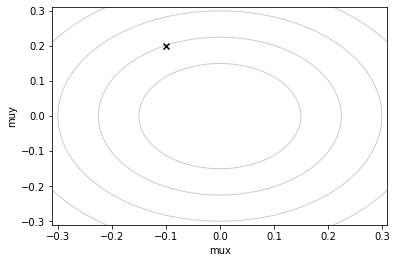

In [ ]:
Q = {}
Q["q"] = np.array([-0.1, 0.2])
pr = 0.31
plt.subplot(ylabel="muy", xlabel="mux", xlim=(-pr, pr), ylim=(-pr, pr))
step = 0.03
L = 11  # 0.03/28 for U-turns --- 11 for working example
n_samples = 4
path_col = (0, 0, 0, 0.5)
for r in 0.075 * np.arange(2, 6):
    plt.gca().add_artist(plt.Circle((0, 0), r, alpha=0.2, fill=False))
plt.scatter(Q["q"][0], Q["q"][1], c="k", marker="x", zorder=4)

In [ ]:
!pip install jax==0.2.22 -f https://storage.googleapis.com/jax-releases/jax_releases.html

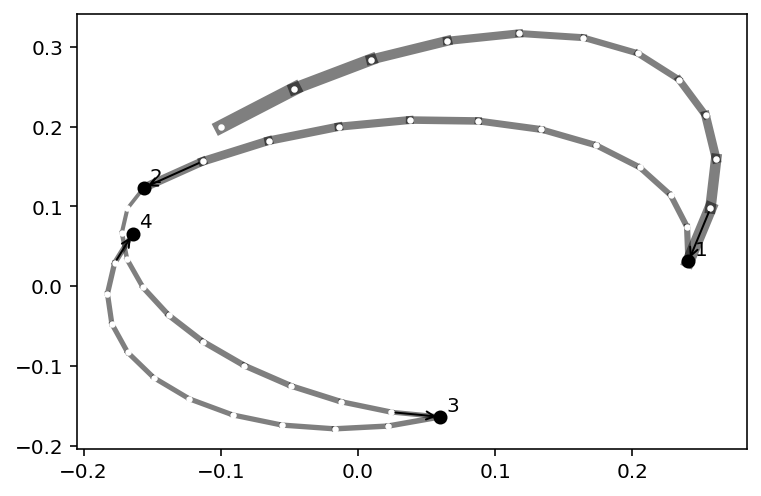

In [ ]:
def HMC2(U, grad_U, epsilon, L, current_q):
    q = current_q

    # Random flick - p is the momentum
    p = tfd.Normal(loc=0.0, scale=1.0).sample(q.shape[0]).numpy()
    current_p = p

    # Make a half step for momentum at the begining
    p = p - epsilon * grad_U(q) / 2

    # initialize bookkeeping - saves trajectory
    qtraj = jnp.full((L + 1, q.shape[0]), np.nan)
    ptraj = qtraj

    qtraj = ops.index_update(qtraj, 0, current_q)
    ptraj = ops.index_update(ptraj, 0, p)

    # Alternate full steps for position and momentum
    for i in range(L):
        q = q + epsilon * p  # Full step for the position
        # Make a full step for the momentum, except at end of trajectory
        if i != (L - 1):
            p = p - epsilon * grad_U(q)
            ptraj = ops.index_update(ptraj, i + 1, p)
        qtraj = ops.index_update(qtraj, i + 1, q)

    # Make a half step for momentum at the end
    p = p - epsilon * grad_U(q) / 2

    # ptraj[L] = p
    ptraj = ops.index_update(ptraj, L, p)

    # Negate momentum at end of trajectory to make the proposal symmetric
    p = -p
    # Evaluate potential and kinetic energies at start and end of trajectory
    current_U = U(current_q)
    current_K = np.sum(current_p ** 2) / 2
    proposed_U = U(q)
    proposed_K = np.sum(p ** 2) / 2
    # Accept or reject the state at end of trajectory, returning either
    # the position at the end of the trajectory or the initial position
    accept = 0
    runif = tfd.Uniform(low=0.0, high=1.0).sample().numpy()
    if runif < np.exp(current_U - proposed_U + current_K - proposed_K):
        new_q = q  # accept
        accept = 1
    else:
        new_q = current_q  # reject

    return {
        "q": new_q,
        "traj": qtraj,
        "ptraj": ptraj,
        "accept": accept,
        "dH": proposed_U + proposed_K - (current_U + current_K),
    }


for i in range(n_samples):
    Q = HMC2(U, U_gradient, step, L, Q["q"])
    if n_samples < 10:
        for j in range(L):
            K0 = np.sum(Q["ptraj"][j] ** 2) / 2
            plt.plot(
                Q["traj"][j : j + 2, 0],
                Q["traj"][j : j + 2, 1],
                c=path_col,
                lw=1 + 2 * K0,
            )
        plt.scatter(Q["traj"][:, 0], Q["traj"][:, 1], c="white", s=5, zorder=3)
        # for fancy arrows
        dx = Q["traj"][L, 0] - Q["traj"][L - 1, 0]
        dy = Q["traj"][L, 1] - Q["traj"][L - 1, 1]
        d = np.sqrt(dx ** 2 + dy ** 2)
        plt.annotate(
            "",
            (Q["traj"][L - 1, 0], Q["traj"][L - 1, 1]),
            (Q["traj"][L, 0], Q["traj"][L, 1]),
            arrowprops={"arrowstyle": "<-"},
        )
        plt.annotate(
            str(i + 1),
            (Q["traj"][L, 0], Q["traj"][L, 1]),
            xytext=(3, 3),
            textcoords="offset points",
        )
    plt.scatter(
        Q["traj"][L + 1, 0],
        Q["traj"][L + 1, 1],
        c=("red" if np.abs(Q["dH"]) > 0.1 else "black"),
        zorder=4,
    )


##Diagnostics 


*   Trace Plot
*   Trank Plot
*   R-hat convergence measure
*   Number of Effective Samples


##Trace Plot

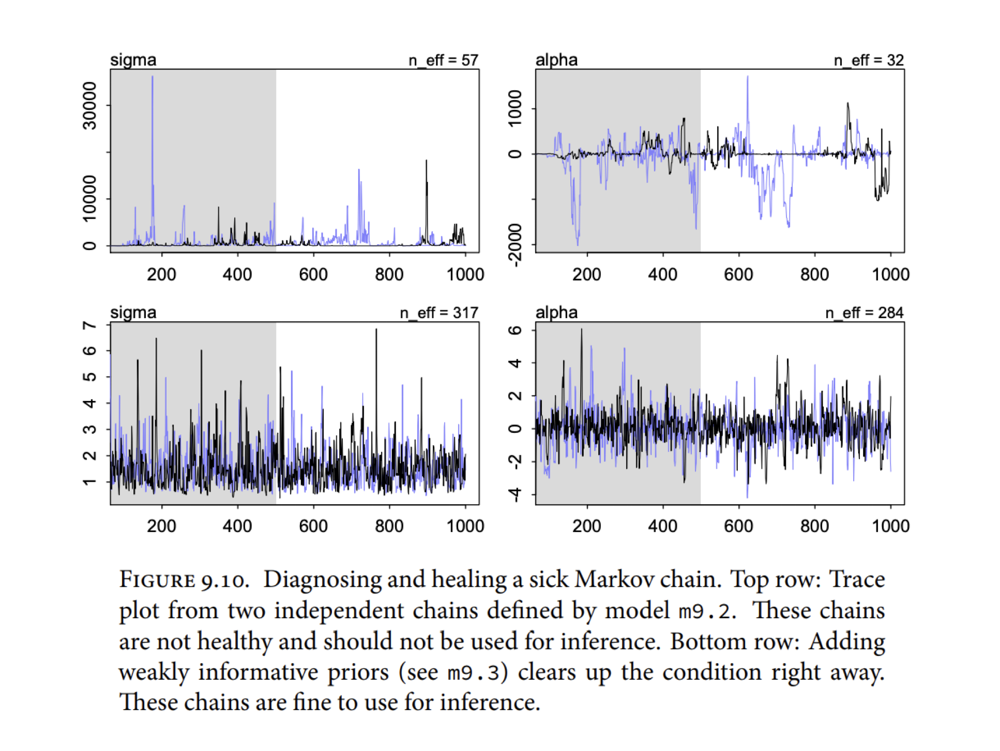

*   Plot for every parameter. You want them to look like Hairy Caterpillars.
*   Chains should be stationary around the same values, and mixing should be good (up and down). 
*   No wild detours into the thousands. And those divergent transitions should be gone.

##Trank Plot (Normalised Trace Plots)
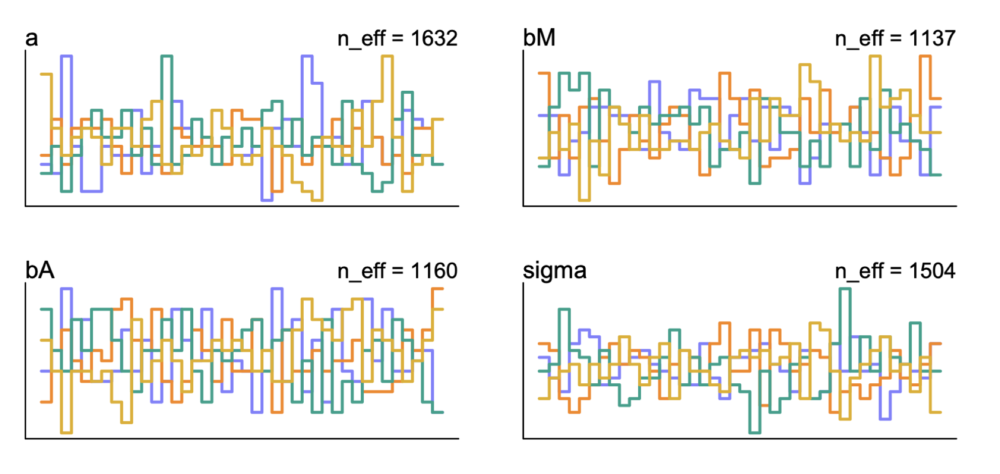

Generally, we Need more than one chain to check convergence.
Convergence: Each Chain explores the right distribution and every chain explores the same explorations

Run multiple chains on multiple cores

Trank plots gives quick heuristic way to assess the chain’s health.

##R-hat (Gelman-Rubin convergence diagnostic)

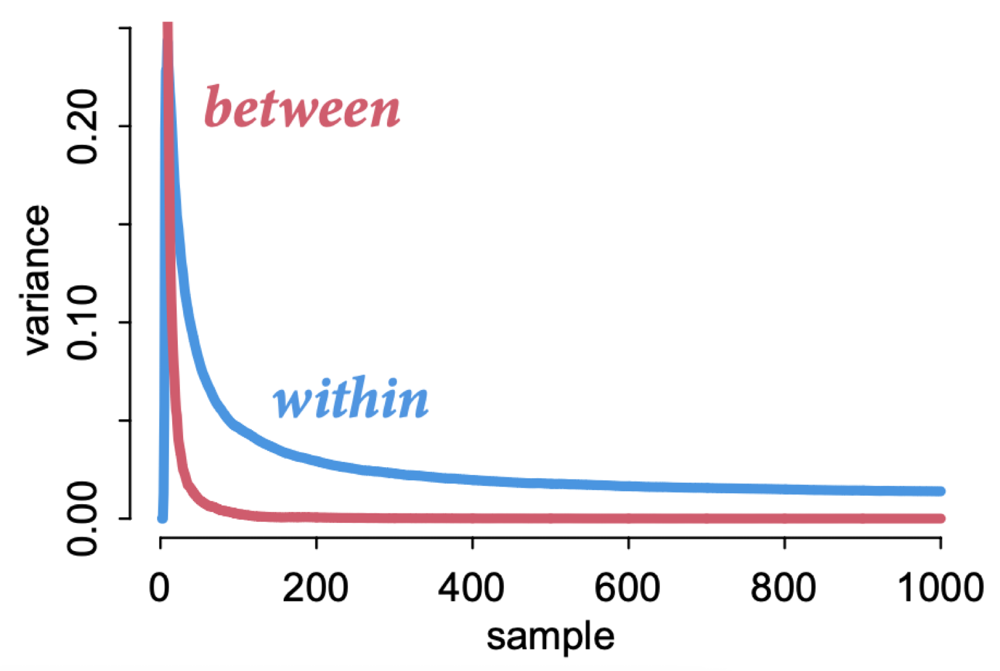

When chains converge: 
Start and End of chains explore similar region

Independent chains explore same region

R-hat is the ratio of variances:
As total variance shrinks to average variance with in the chain, R-hat approaches 1.

When R-hat is above 1.00, it usually indicates that the chain has not yet converged, and probably you shouldn’t trust the samples. If you draw more iterations, it could be fine, or it could never converge

View it perhaps as a signal of danger, but never of safety

##Number of Effective Samples


“Usually in deep learning we just run for n steps, for some n that we think will be big enough, and hope for the best.”

~ Ian Goodfellow 

• Mixing can take an infeasibly long time. But, if the effective samples number is too low, it means we have a problem. 



#### The Folk Theorem of Statistical Computing

>   *If you are having computational problems, probably your model is wrong.*